<a href="https://colab.research.google.com/github/carlakim/MIR/blob/main/SIngle_Label_MIR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#How theme songs set the tone to the show genre



* classify based on theme song  
* deduct the genre solley based on the theme song

make a separate file with non showed songs for the training

The biggest issue here was creating a multilabel classification system

##imports

In [ ]:
import librosa
from librosa import feature
import numpy as np
import pandas as pd
from os import listdir
from os.path import isfile, join
import matplotlib.pyplot as plt

from librosa import display
import numpy, scipy, matplotlib.pyplot as plt, sklearn, urllib, IPython.display as ipd

In [ ]:
                                                                                                   from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Audio smaple for each Genre

Example for each genre

##Action - LOKI

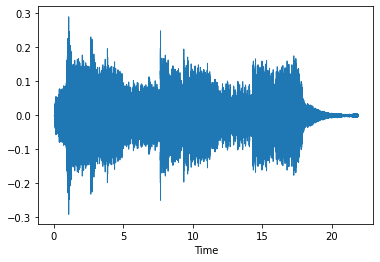

In [ ]:
fileAc= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/LOKI.wav'
y, sr = librosa.load(fileAc)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Adventure - A series of Unfortunate Events

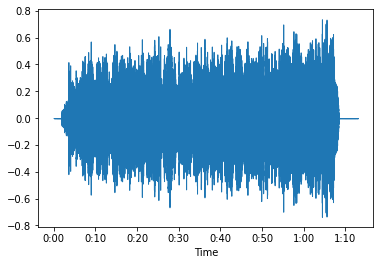

In [ ]:
fileAd= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/A_Series_Unfortunate_Events.wav'
y, sr = librosa.load(fileAd)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Comedy - Modern Family

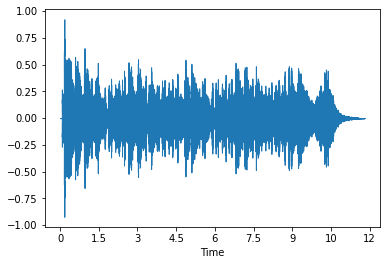

In [ ]:
fileCo= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Modern_family.wav'
y, sr = librosa.load(fileCo)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Crime - Stranger Things

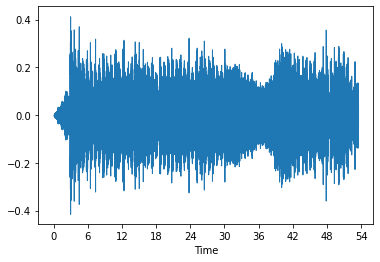

In [ ]:
fileCr= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Stranger_things.wav'
y, sr = librosa.load(fileCr)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

##Drama - The Crown

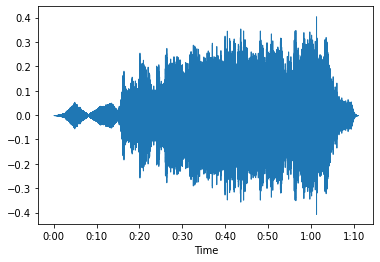

In [ ]:
fileD= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/The_crown.wav'
y, sr = librosa.load(fileD)
librosa.display.waveshow(y,sr)
ipd.display(ipd.Audio(y, rate=sr))

#Understanding Audio files and genres

##RMS Energy

In [ ]:
FRAME_SIZE = 1024
HOP_LENGTH = 512

In [ ]:
# load audio files with librosa
actionn, sr = librosa.load(fileAc)
adventuree, _ = librosa.load(fileAd)
comedyy, _ = librosa.load(fileCo)
crimee, _ = librosa.load(fileCr)
dramaa, _ = librosa.load(fileD)

In [ ]:
rms_action = librosa.feature.rms(actionn, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_adventure = librosa.feature.rms(adventuree, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_comedy = librosa.feature.rms(comedyy, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_crime = librosa.feature.rms(crimee, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]
rms_drama = librosa.feature.rms(dramaa, frame_length=FRAME_SIZE, hop_length=HOP_LENGTH)[0]

In [ ]:
rms_action.shape

(943,)

In [ ]:
rms_adventure.shape

(3148,)

In [ ]:
rms_comedy.shape

(509,)

In [ ]:
rms_crime.shape

(2304,)

In [ ]:
rms_drama.shape

(3061,)

In [ ]:
framesAc = range(len(rms_action))
tac = librosa.frames_to_time(framesAc, hop_length=HOP_LENGTH)

framesAd = range(len(rms_adventure))
tad = librosa.frames_to_time(framesAd, hop_length=HOP_LENGTH)

framesCo = range(len(rms_comedy))
tco = librosa.frames_to_time(framesCo, hop_length=HOP_LENGTH)

framesCr = range(len(rms_crime))
tcr = librosa.frames_to_time(framesCr, hop_length=HOP_LENGTH)

framesD = range(len(rms_drama))
tD = librosa.frames_to_time(framesD, hop_length=HOP_LENGTH)

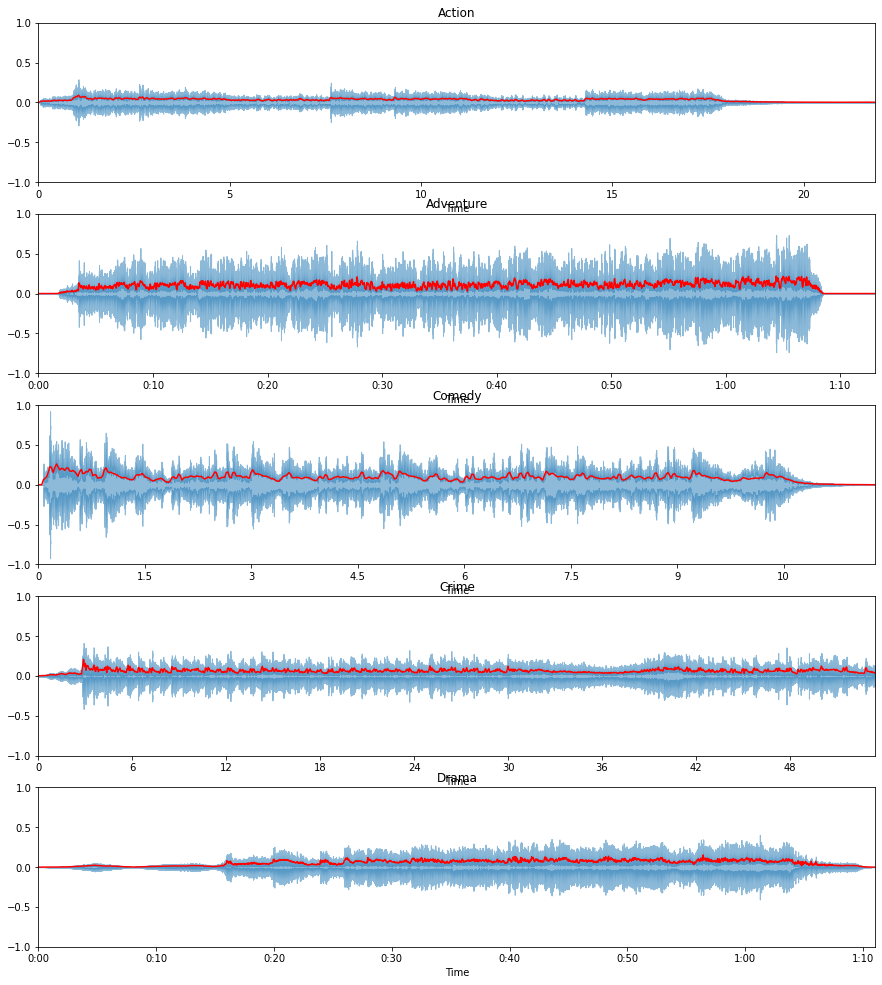

In [ ]:
plt.figure(figsize=(15, 17))

ax = plt.subplot(5, 1, 1)
librosa.display.waveplot(actionn, alpha=0.5)
plt.plot(tac, rms_action, color="r")
plt.ylim((-1, 1))
plt.title("Action")

plt.subplot(5, 1, 2)
librosa.display.waveplot(adventuree, alpha=0.5)
plt.plot(tad, rms_adventure, color="r")
plt.ylim((-1, 1))
plt.title("Adventure")

plt.subplot(5, 1, 3)
librosa.display.waveplot(comedyy, alpha=0.5)
plt.plot(tco, rms_comedy, color="r")
plt.ylim((-1, 1))
plt.title("Comedy")

plt.subplot(5, 1, 4)
librosa.display.waveplot(crimee, alpha=0.5)
plt.plot(tcr, rms_crime, color="r")
plt.ylim((-1, 1))
plt.title("Crime")

plt.subplot(5, 1, 5)
librosa.display.waveplot(dramaa, alpha=0.5)
plt.plot(tD, rms_drama, color="r")
plt.ylim((-1, 1))
plt.title("Drama")

plt.show()

Red is the RMS energy

Root-mean-square of all samples in the frame, the square of the amplitude is the energy, sum the energy for all samples in frame t, and have the mean of it.

* Indicator of loudness
* Less sensitive to outliers than Amplitude Envelope

##Genre feaure exploration

semantic and symbolic extraction and analysys

tv shows decision on choosing the opening theme song

###Tempo estimation

In [ ]:
# 1. Get the file path to an included audio example
filenameA= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/LOKI.wav'


# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(filenameA)

# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

print('Loki (action) estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

Loki (action) estimated tempo: 107.67 beats per minute


In [ ]:
# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=adventuree, sr=sr)

print('A series of unfortunate events (adventure) estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

A series of unfortunate events (adventure) estimated tempo: 136.00 beats per minute


In [ ]:
# 1. Get the file path to an included audio example
filenameb= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/The_crown.wav'


# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(filenameb)

# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

print('The Crown (drama) estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

The Crown (drama) estimated tempo: 60.09 beats per minute


In [ ]:
# 1. Get the file path to an included audio example
filenamec= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Modern_family.wav'


# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(filenamec)

# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

print('Modern Family (comedy) estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

Modern Family (comedy) estimated tempo: 117.45 beats per minute


In [ ]:
# 1. Get the file path to an included audio example
filenamed= '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Stranger_things.wav'


# 2. Load the audio as a waveform `y`
#    Store the sampling rate as `sr`
y, sr = librosa.load(filenamed)

# 3. Run the default beat tracker
tempo, beat_frames = librosa.beat.beat_track(y=y, sr=sr)

print('Stranger Things (crime) estimated tempo: {:.2f} beats per minute'.format(tempo))

# 4. Convert the frame indices of beat events into timestamps
beat_times = librosa.frames_to_time(beat_frames, sr=sr)

Stranger Things (crime) estimated tempo: 112.35 beats per minute


In [ ]:
# y, sr = librosa.load(filenamed)
# # https://librosa.org/doc/0.9.1/tutorial.html

# # Set the hop length; at 22050 Hz, 512 samples ~= 23ms
# hop_length = 512

# # Separate harmonics and percussives into two waveforms
# y_harmonic, y_percussive = librosa.effects.hpss(y)

# # Beat track on the percussive signal
# tempo, beat_frames = librosa.beat.beat_track(y=y_percussive,
#                                              sr=sr)

# # Compute MFCC features from the raw signal
# mfcc = librosa.feature.mfcc(y=y, sr=sr, hop_length=hop_length, n_mfcc=13)

# # And the first-order differences (delta features)
# mfcc_delta = librosa.feature.delta(mfcc)

# # Stack and synchronize between beat events
# # This time, we'll use the mean value (default) instead of median
# beat_mfcc_delta = librosa.util.sync(np.vstack([mfcc, mfcc_delta]),
#                                     beat_frames)

# # Compute chroma features from the harmonic signal
# chromagram = librosa.feature.chroma_cqt(y=y_harmonic,
#                                         sr=sr)

# # Aggregate chroma features between beat events
# # We'll use the median value of each feature between beat frames
# beat_chroma = librosa.util.sync(chromagram,
#                                 beat_frames,
#                                 aggregate=np.median)

# # Finally, stack all beat-synchronous features together
# beat_features = np.vstack([beat_chroma, beat_mfcc_delta])

###Audio segments info

In [ ]:
!pip install pydub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pydub import AudioSegment

In [ ]:
# Print attributes
audio_segment = AudioSegment.from_file("/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/LOKI.wav")
print('Action:')
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Action:
Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 21873
Frame count: 964608.0
Intensity: -26.660705650503278


In [ ]:
# Print attributes
audio_segment = AudioSegment.from_file("/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/A_Series_Unfortunate_Events.wav")
print('Adventure:')
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Adventure:
Channels: 2
Sample width: 2
Frame rate (sample rate): 48000
Frame width: 4
Length (ms): 73073
Frame count: 3507514.0
Intensity: -18.879480625555484


In [ ]:
# Print attributes
audio_segment = AudioSegment.from_file("/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Modern_family.wav")
print('Comedy:')
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Comedy:
Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 11796
Frame count: 520192.0
Intensity: -18.660912738813796


In [ ]:
# Print attributes
audio_segment = AudioSegment.from_file("/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/The_crown.wav")
print('Drama:')
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Drama:
Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 71053
Frame count: 3133440.0
Intensity: -21.713953099146195


In [ ]:
# Print attributes
audio_segment = AudioSegment.from_file("/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Stranger_things.wav")
print("Crime:")
print(f"Channels: {audio_segment.channels}")
print(f"Sample width: {audio_segment.sample_width}")
print(f"Frame rate (sample rate): {audio_segment.frame_rate}")
print(f"Frame width: {audio_segment.frame_width}")
print(f"Length (ms): {len(audio_segment)}")
print(f"Frame count: {audio_segment.frame_count()}")
print(f"Intensity: {audio_segment.dBFS}")

Crime:
Channels: 2
Sample width: 2
Frame rate (sample rate): 44100
Frame width: 4
Length (ms): 53476
Frame count: 2358272.0
Intensity: -22.458576900555713


##Spectrograms

A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time. It’s a representation of frequencies changing with respect to time for given music signals.

STFT
@ a small segment of the audio, in a frame

In [ ]:
def plot_spectrogram(Y, sr, hop_length, y_axis="linear"):
    plt.figure(figsize=(25, 10))
    librosa.display.specshow(Y,
                             sr=sr,
                             hop_length=hop_length,
                             x_axis="time",
                             y_axis=y_axis)
    plt.colorbar(format="%+2.f")

In [ ]:
Frame_size = 2048
hop_size = 512

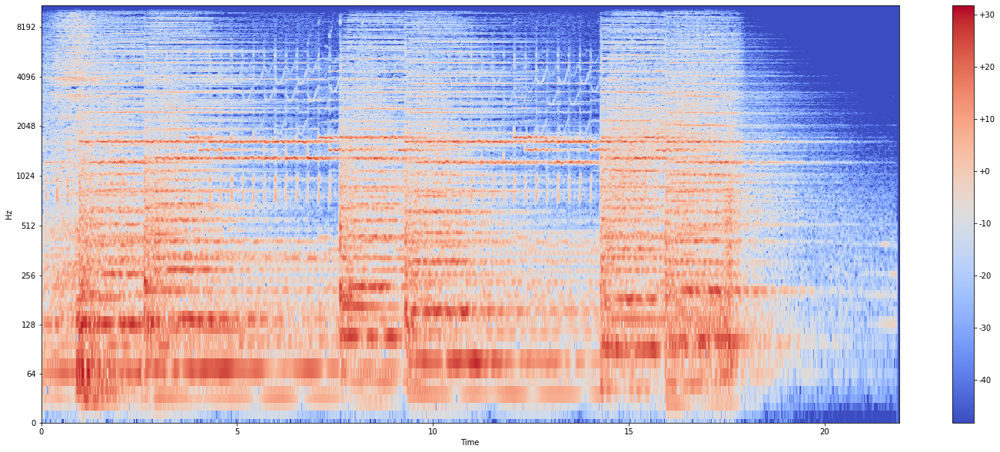

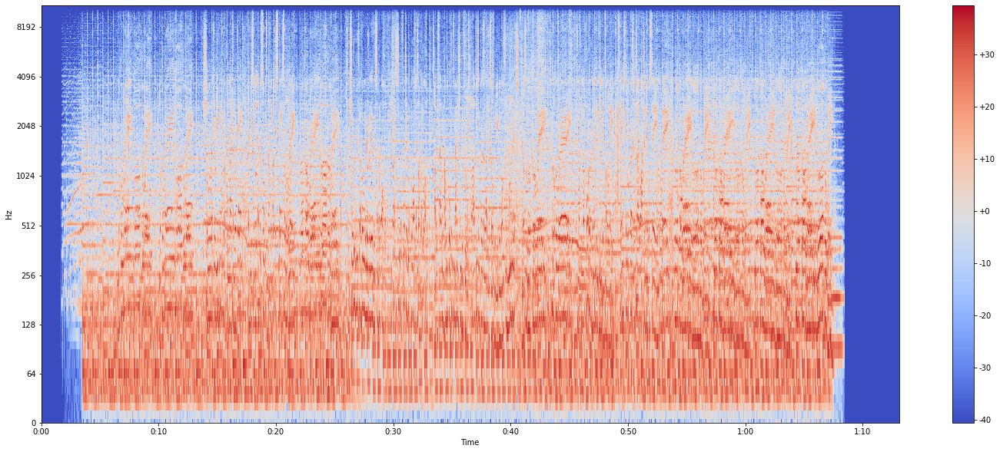

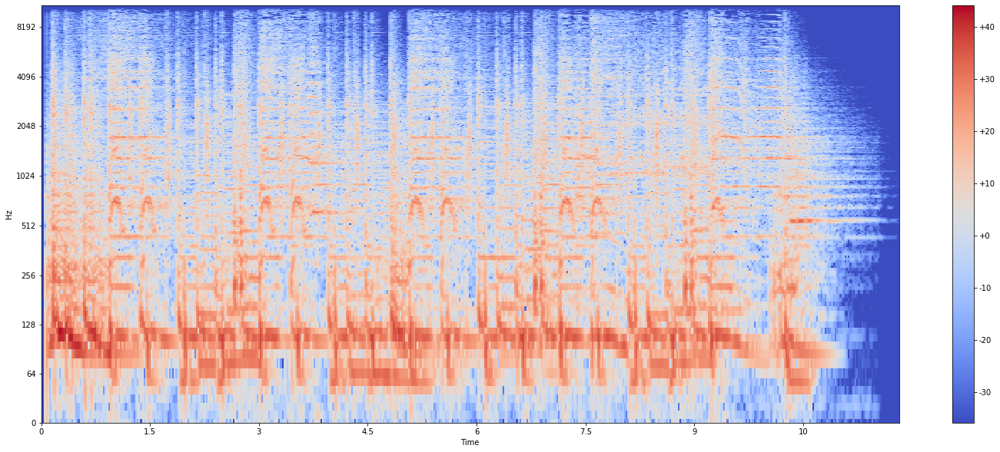

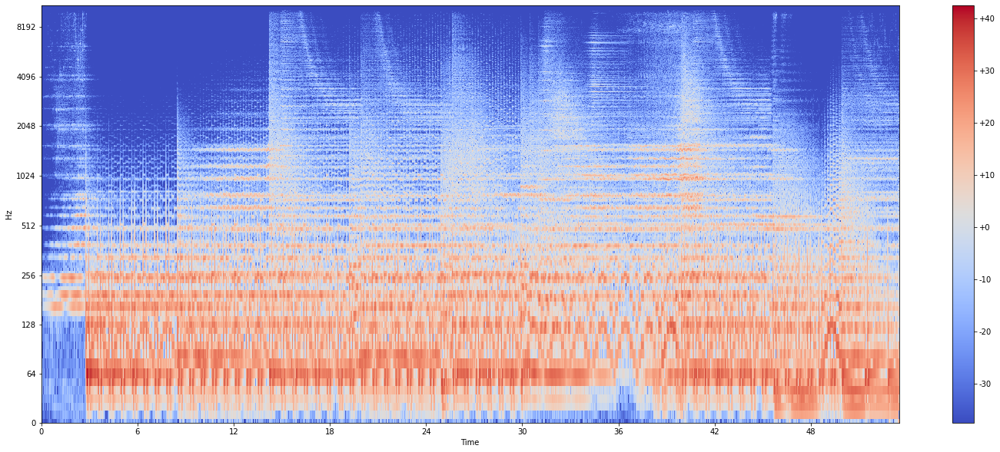

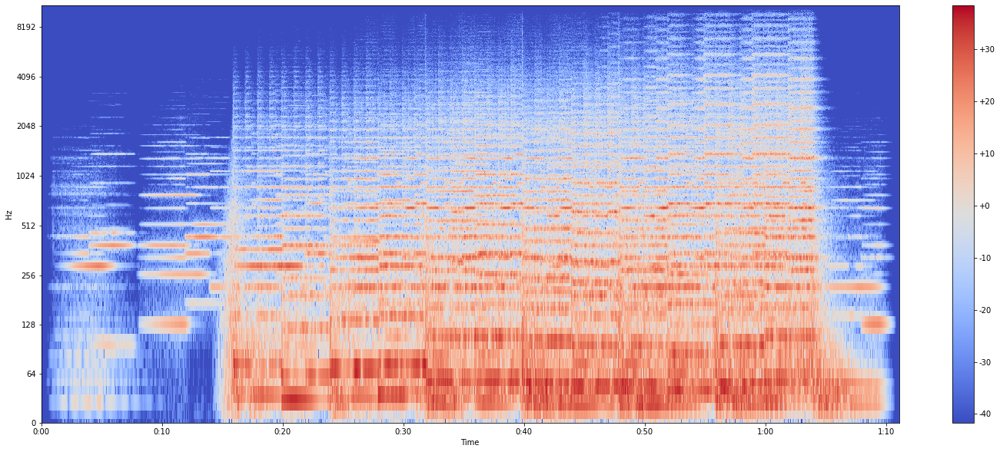

In [ ]:
S_action = librosa.stft(actionn, n_fft=Frame_size, hop_length=hop_size)
S_adventure = librosa.stft(adventuree, n_fft=Frame_size, hop_length=hop_size)
S_comedy = librosa.stft(comedyy, n_fft=Frame_size, hop_length=hop_size)
S_crime = librosa.stft(crimee, n_fft=Frame_size, hop_length=hop_size)
S_drama = librosa.stft(dramaa, n_fft=Frame_size, hop_length=hop_size)

Y_action = librosa.power_to_db(np.abs(S_action) ** 2)
Y_adventure = librosa.power_to_db(np.abs(S_adventure) ** 2)
Y_comedy = librosa.power_to_db(np.abs(S_comedy) ** 2)
Y_crime = librosa.power_to_db(np.abs(S_crime) ** 2)
Y_drama = librosa.power_to_db(np.abs(S_drama) ** 2)

plot_spectrogram(Y_action, sr, hop_size, y_axis="log")
plot_spectrogram(Y_adventure, sr, hop_size, y_axis="log")
plot_spectrogram(Y_comedy, sr, hop_size, y_axis="log")
plot_spectrogram(Y_crime, sr, hop_size, y_axis="log")
plot_spectrogram(Y_drama, sr, hop_size, y_axis="log")

##Zero Crossing Rate

The zero crossing rate is the rate of sign-changes along a signal, i.e., the rate at which the signal changes from positive to negative or back. This feature has been used heavily in both speech recognition and music information retrieval.

In [ ]:
actionn, sr = librosa.load(fileAc)
adventuree, _ = librosa.load(fileAd)
comedyy, _ = librosa.load(fileCo)
crimee, _ = librosa.load(fileCr)
dramaa, _ = librosa.load(fileD)

Action

Zero crossing rate: 52151


Text(0.5, 1.0, 'Action Example')

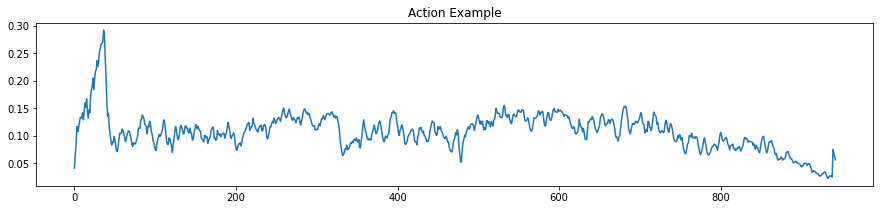

In [ ]:
zcrs = librosa.feature.zero_crossing_rate(actionn)

print(f"Zero crossing rate: {sum(librosa.zero_crossings(actionn))}")

plt.figure(figsize=(15, 3))
plt.plot(zcrs[0])
plt.title('Action Example')

Adventure

Zero crossing rate: 126873


Text(0.5, 1.0, 'Adventure Example')

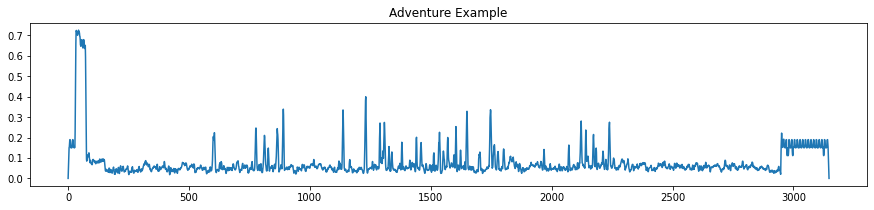

In [ ]:
zcrs = librosa.feature.zero_crossing_rate(adventuree)

print(f"Zero crossing rate: {sum(librosa.zero_crossings(adventuree))}")

plt.figure(figsize=(15, 3))
plt.plot(zcrs[0])
plt.title('Adventure Example')

Comedy

Zero crossing rate: 23538


Text(0.5, 1.0, 'Comedy Example')

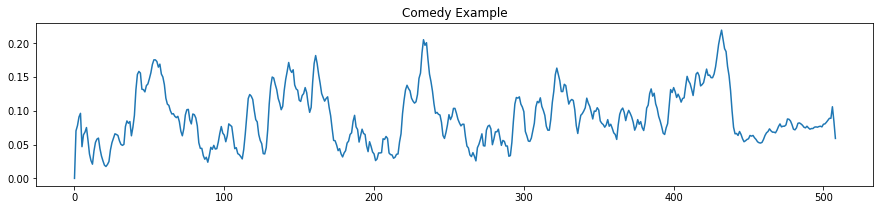

In [ ]:
zcrs = librosa.feature.zero_crossing_rate(comedyy)

print(f"Zero crossing rate: {sum(librosa.zero_crossings(comedyy))}")

plt.figure(figsize=(15, 3))
plt.plot(zcrs[0])
plt.title('Comedy Example')

Crime

Zero crossing rate: 34366


Text(0.5, 1.0, 'Action Example')

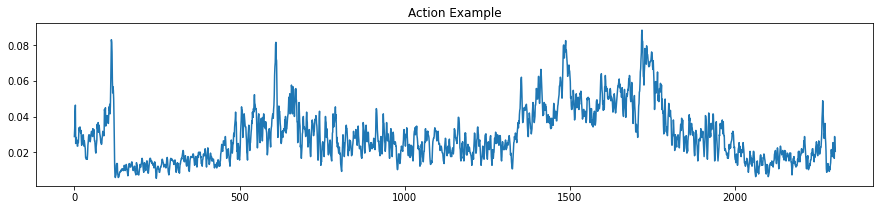

In [ ]:
zcrs = librosa.feature.zero_crossing_rate(crimee)

print(f"Zero crossing rate: {sum(librosa.zero_crossings(crimee))}")

plt.figure(figsize=(15, 3))
plt.plot(zcrs[0])
plt.title('Action Example')

Drama

Zero crossing rate: 55705


Text(0.5, 1.0, 'Action Example')

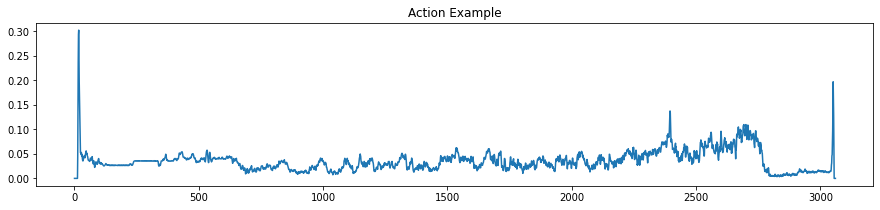

In [ ]:
zcrs = librosa.feature.zero_crossing_rate(dramaa)

print(f"Zero crossing rate: {sum(librosa.zero_crossings(dramaa))}")

plt.figure(figsize=(15, 3))
plt.plot(zcrs[0])
plt.title('Action Example')

##Spectral Centroid

If the frequencies in music are same throughout then spectral centroid would be around a centre and if there are high frequencies at the end of sound then the centroid would be towards its end.

##Chroma feature

is a powerful tool for analyzing music whose pitches can be meaningfully categorized (often into twelve categories) and whose tuning approximates to the equal-tempered scale. One main property of chroma features is that they capture harmonic and melodic characteristics of music, while being robust to changes in timbre and instrumentation.

Action

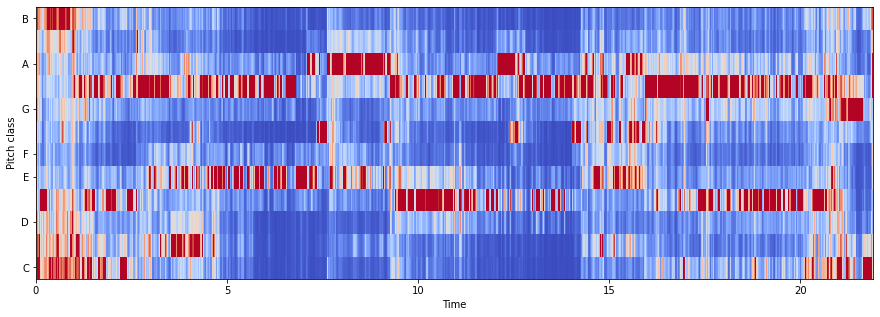

In [ ]:
chromagram = librosa.feature.chroma_stft(actionn, sr=sr)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', cmap='coolwarm')

Adventure

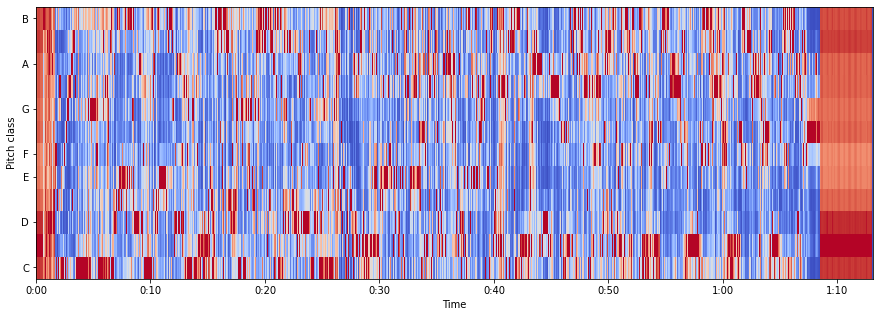

In [ ]:
chromagram = librosa.feature.chroma_stft(adventuree, sr=sr)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', cmap='coolwarm')

Crime

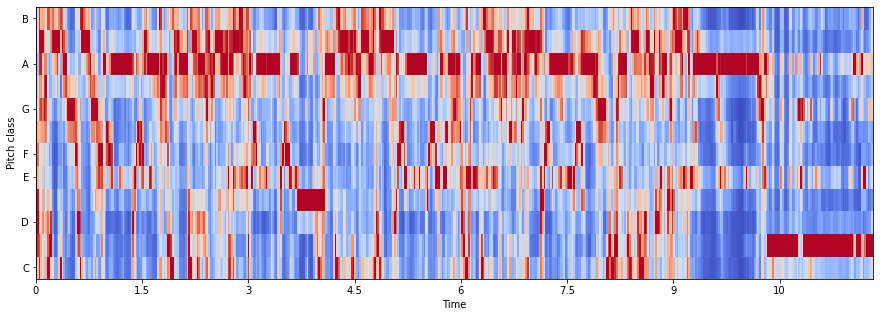

In [ ]:
chromagram = librosa.feature.chroma_stft(comedyy, sr=sr)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', cmap='coolwarm')

Comedy

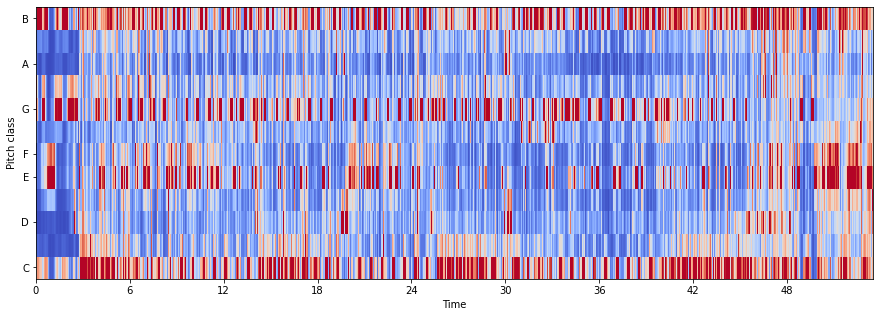

In [ ]:
chromagram = librosa.feature.chroma_stft(crimee, sr=sr)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', cmap='coolwarm')

Drama

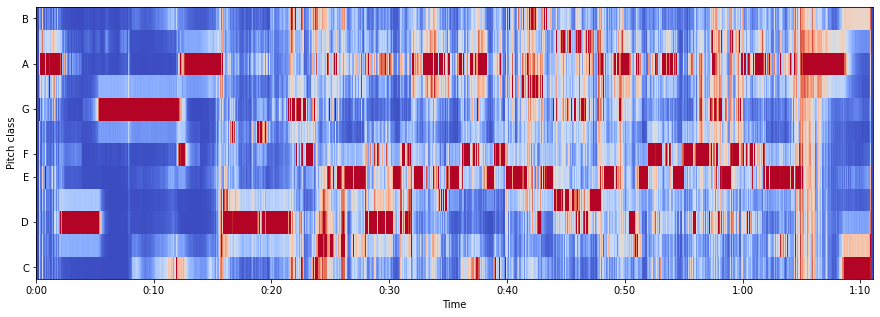

In [ ]:
chromagram = librosa.feature.chroma_stft(dramaa, sr=sr)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', cmap='coolwarm')

#Feature extraction

make df wiht all features

##Mfcc features DF

In [ ]:
import os

In [ ]:
for file in listdir('/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/'):
  print(file)

Breaking_bad.wav
Euphoria.wav
Gossip_girl.wav
Doutlander.wav
Grey_anatomy.wav
Game_of_thrones.wav
House.wav
The_crown.wav
The_office.wav
Modern_family.wav
New_girl.wav
Two_half_man.wav
HIMYM.wav
Friends.wav
Fresh_off_boat.wav
Brooklyn99.wav
The_Big_Bang_Theory.wav
Sex_and_the_City.wav
The_IT_Crowd.wav
2_Broke_Girls.wav
American_Horror_Story.wav
Anne_with_an_E.wav
Arrested_Development.wav
Bones.wav
Bridgerton.wav
Criminal_Minds.wav
Daredevil.wav
Derry_Girls.wav
Desperate_Housewives.wav
Doctor_Who.wav
Family_Guy.wav
Ghosts.wav
Gilmore_Girls.wav
Gravity_Falls.wav
Guillermo_del_Toros_Cabinet_of_Curiosities.wav
Heroes.wav
House_of_the_Dragon.wav
LOKI.wav
Lucifer.wav
Moon_Knight.wav
One_Tree_Hill.wav
Orange_is_the_New_Black.wav
Once_upon_a_time.wav
iCarly.wav
LOST.wav
Peacemaker.wav
Pretty_Little_Liars.wav
Rick_and_Morty.wav
Shadowhunters.wav
Shameless.wav
Sherlock.wav
Smallville.wav
SpongeBob_SquarePants.wav
Stranger_things.wav
Narcos.wav
Superstore.wav
Ted_Lasso.wav
The_100.wav
The_Flash.w

In [ ]:
#feature extraction mfcc def
def feature_extrq(file_path):
  #load audio file
  x, sample_rate = librosa.load(file_path, res_type = 'kaiser_fast')
  #extract mfcc features
  mfcc = np.mean(librosa.feature.mfcc(y=x, sr=sample_rate, n_mfcc=20).T, axis=0)

  return mfcc

In [ ]:
from glob import glob
features = pd.DataFrame()
directory = '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/'
for audio in os.listdir(directory):
  audio_path = (directory + audio)
  features[audio_path] = feature_extrq(audio_path)

<ipython-input-80-cf065cdfe241>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`


In [ ]:
mfcc_df = features.T
mfcc_df.head(3)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Breaking_bad.wav,-274.637329,113.233955,8.027579,41.754524,6.241176,14.467341,-6.124802,17.595718,-1.380058,6.443252,-1.461125,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747
/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Euphoria.wav,-161.339615,132.324921,-10.123459,9.916463,-0.565347,11.114403,-6.776842,6.431011,-13.567740,-5.141156,-1.358189,2.322693,-10.201549,-3.315402,-6.908276,4.171134,-4.884076,-0.354753,0.196119,-4.870142
/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/Gossip_girl.wav,-137.910461,97.692894,-14.159046,20.215469,-6.420263,14.248572,-5.511131,12.388307,-3.710921,11.521400,-8.038747,7.619081,-5.054358,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607


In [ ]:
#reaname columns
mfcc_df.rename(columns = {0:'mfcc_0'}, inplace = True)
mfcc_df.rename(columns = {1:'mfcc_1'}, inplace = True)
mfcc_df.rename(columns = {2:'mfcc_2'}, inplace = True)
mfcc_df.rename(columns = {3:'mfcc_3'}, inplace = True)
mfcc_df.rename(columns = {4:'mfcc_4'}, inplace = True)
mfcc_df.rename(columns = {5:'mfcc_5'}, inplace = True)
mfcc_df.rename(columns = {6:'mfcc_6'}, inplace = True)
mfcc_df.rename(columns = {7:'mfcc_7'}, inplace = True)
mfcc_df.rename(columns = {8:'mfcc_8'}, inplace = True)
mfcc_df.rename(columns = {9:'mfcc_9'}, inplace = True)
mfcc_df.rename(columns = {10:'mfcc_10'}, inplace = True)
mfcc_df.rename(columns = {11:'mfcc_11'}, inplace = True)
mfcc_df.rename(columns = {12:'mfcc_12'}, inplace = True)
mfcc_df.rename(columns = {13:'mfcc_13'}, inplace = True)
mfcc_df.rename(columns = {14:'mfcc_14'}, inplace = True)
mfcc_df.rename(columns = {15:'mfcc_15'}, inplace = True)
mfcc_df.rename(columns = {16:'mfcc_16'}, inplace = True)
mfcc_df.rename(columns = {17:'mfcc_17'}, inplace = True)
mfcc_df.rename(columns = {18:'mfcc_18'}, inplace = True)
mfcc_df.rename(columns = {19:'mfcc_19'}, inplace = True)

In [ ]:
#change index
l = []
i = 0
while i <= 108:
  l.append(i)
  i += 1

In [ ]:
mfcc_df.index = l
mfcc_df

,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19
0,-274.637329,113.233955,8.027579,41.754524,6.241176,14.467341,-6.124802,17.595718,-1.380058,6.443252,-1.461125,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747
1,-161.339615,132.324921,-10.123459,9.916463,-0.565347,11.114403,-6.776842,6.431011,-13.567740,-5.141156,-1.358189,2.322693,-10.201549,-3.315402,-6.908276,4.171134,-4.884076,-0.354753,0.196119,-4.870142
2,-137.910461,97.692894,-14.159046,20.215469,-6.420263,14.248572,-5.511131,12.388307,-3.710921,11.521400,-8.038747,7.619081,-5.054358,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607
3,-217.101746,107.443130,2.144845,25.575640,3.535717,6.747437,-4.301415,9.593795,-7.512391,10.718860,-12.215542,3.898463,-9.944083,1.435769,-7.186730,2.501754,-2.499355,2.333581,-4.027172,5.271726
4,-351.466003,113.362427,8.723533,22.925785,-11.440248,8.835173,-10.043488,4.157614,-7.875982,9.926516,-7.596777,5.497686,-7.935298,7.435072,-6.467572,5.019539,-4.574422,5.415137,-2.643821,3.809658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,-117.482224,95.048523,-0.396764,23.578781,-11.494800,17.014753,-9.357750,9.550844,-8.571308,5.583129,-6.846778,4.344421,-6.702014,2.284228,-12.936172,-3.882426,-11.407921,-1.870505,-6.803664,1.905485
105,-206.520889,131.926483,-23.838186,36.090374,-3.423972,12.331473,-8.440591,7.694134,-15.911804,4.659955,-14.672891,-1.565965,-12.504839,-2.031272,-14.191781,-3.374764,-11.237590,0.337786,-7.075438,1.554557
106,-382.710236,134.560654,13.846865,29.777124,9.941958,7.393334,2.569114,-3.073490,-3.521241,19.135298,-25.316021,5.139473,-7.494651,-4.575845,-21.621532,-0.339456,-15.618864,-7.945179,-4.500545,-3.644385
107,-218.388489,74.457474,5.919066,45.161060,17.792927,32.879925,6.316730,16.626322,-4.175472,18.188196,0.793496,16.616184,0.148368,12.718402,-3.207719,10.164768,-1.456300,4.976620,-5.072966,6.952509


##Other features

In [ ]:
from glob import glob
#directories of normal audios
data_dir = '/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/'
audio_files = glob(data_dir + '*wav')

print(f'Number of audios : {len(audio_files)}')

Number of audios : 109


In [ ]:
fn_list_i = [
 librosa.get_duration,
 feature.chroma_stft,
 feature.spectral_centroid,
 feature.spectral_bandwidth,
 feature.spectral_rolloff
]

fn_list_ii = [
 feature.rms,
 feature.zero_crossing_rate,
 librosa.beat.tempo,
 librosa.beat.plp

]

def get_feature_vector(y,sr):
   feat_vect_i = [ np.mean(funct(y,sr)) for funct in fn_list_i]
   feat_vect_ii = [ np.mean(funct(y)) for funct in fn_list_ii]
   feature_vector = feat_vect_i + feat_vect_ii
   return feature_vector

In [ ]:
#build the matrix with audios featurized
audios_feat = []
for file in audio_files:

  y,sr = librosa.load(file,sr=None)
  feature_vector = get_feature_vector(y, sr)
  audios_feat.append(feature_vector)
  print('.', end= " ")

. . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

In [ ]:
#make csv file
import csv
norm_output = 'TVSongs.csv'
header =[
 'length',
 'chroma_stft',
 'spectral_centroid',
 'spectral_bandwidth',
 'spectral_rolloff',
 'rms',
 'zero_crossing_rate',
 'tempo',
 'beat'
]

with open(norm_output,'+w') as f:
 csv_writer = csv.writer(f, delimiter = ',')
 csv_writer.writerow(header)
 csv_writer.writerows(audios_feat)

In [ ]:
#make df
dfs = pd.DataFrame (audios_feat, columns = [
 'lenght',
 'chroma_stft',
 'spectral_centroid',
 'spectral_bandwidth',
 'spectral_rolloff',
 'rms',
 'zero_crossing_rate',
 'tempo',
 'beat'])

dfs.head(5)

,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat
0,18.041905,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,123.046875,0.070617
1,70.797642,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,129.199219,0.093169
2,12.469116,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,103.359375,0.139088
3,72.701678,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,117.453835,0.140456
4,27.933605,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,123.046875,0.138128


concat mfcc and general info

In [ ]:
#concat both df
songdf = pd.concat([dfs,mfcc_df], axis=1, join='inner')
songdf.head()

,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat,mfcc_0,...,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19
0,18.041905,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,123.046875,0.070617,-274.637329,...,-1.461125,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747
1,70.797642,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,129.199219,0.093169,-161.339615,...,-1.358189,2.322693,-10.201549,-3.315402,-6.908276,4.171134,-4.884076,-0.354753,0.196119,-4.870142
2,12.469116,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,103.359375,0.139088,-137.910461,...,-8.038747,7.619081,-5.054358,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607
3,72.701678,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,117.453835,0.140456,-217.101746,...,-12.215542,3.898463,-9.944083,1.435769,-7.186730,2.501754,-2.499355,2.333581,-4.027172,5.271726
4,27.933605,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,123.046875,0.138128,-351.466003,...,-7.596777,5.497686,-7.935298,7.435072,-6.467572,5.019539,-4.574422,5.415137,-2.643821,3.809658


cleaning names

In [ ]:
dft = pd.DataFrame(audio_files)
dft.columns = ['Song']
dft.head(3)

,Song
0,/content/drive/MyDrive/Colab Notebooks/TODOSSO...
1,/content/drive/MyDrive/Colab Notebooks/TODOSSO...
2,/content/drive/MyDrive/Colab Notebooks/TODOSSO...


In [ ]:
dft['Song'] = dft['Song'].str.replace("/content/drive/MyDrive/Colab Notebooks/TODOSSONGS/", "")
dft['Song'] = dft['Song'].str.replace('.wav', '')
dft.head(3)

<ipython-input-92-96efab5d74e2>:2: FutureWarning: The default value of regex will change from True to False in a future version.


,Song
0,Breaking_bad
1,Euphoria
2,Gossip_girl


In [ ]:
#concat both df
df1 = pd.concat([dft, songdf], axis=1, join='inner')
df1

,Song,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat,...,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19
0,Breaking_bad,18.041905,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,123.046875,0.070617,...,-1.461125,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747
1,Euphoria,70.797642,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,129.199219,0.093169,...,-1.358189,2.322693,-10.201549,-3.315402,-6.908276,4.171134,-4.884076,-0.354753,0.196119,-4.870142
2,Gossip_girl,12.469116,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,103.359375,0.139088,...,-8.038747,7.619081,-5.054358,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607
3,Doutlander,72.701678,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,117.453835,0.140456,...,-12.215542,3.898463,-9.944083,1.435769,-7.186730,2.501754,-2.499355,2.333581,-4.027172,5.271726
4,Grey_anatomy,27.933605,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,123.046875,0.138128,...,-7.596777,5.497686,-7.935298,7.435072,-6.467572,5.019539,-4.574422,5.415137,-2.643821,3.809658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,Skins,30.139521,0.468431,3314.477846,3640.374162,6823.041070,0.189796,0.073495,92.285156,0.165821,...,-6.846778,4.344421,-6.702014,2.284228,-12.936172,-3.882426,-11.407921,-1.870505,-6.803664,1.905485
105,Downton_Abbey,30.023401,0.409891,1645.299606,2103.878980,3237.854613,0.075103,0.037672,151.999081,0.123228,...,-14.672891,-1.565965,-12.504839,-2.031272,-14.191781,-3.374764,-11.237590,0.337786,-7.075438,1.554557
106,Casa_de_Papel,58.444626,0.393957,1799.617942,2654.525358,3901.457163,0.021707,0.033051,99.384014,0.140637,...,-25.316021,5.139473,-7.494651,-4.575845,-21.621532,-0.339456,-15.618864,-7.945179,-4.500545,-3.644385
107,Peaky_blinders,69.799184,0.572874,2495.374782,3166.929076,5628.252158,0.108990,0.035342,117.453835,0.189673,...,0.793496,16.616184,0.148368,12.718402,-3.207719,10.164768,-1.456300,4.976620,-5.072966,6.952509


In [ ]:
songdf.to_csv('musicasDF.csv')

In [ ]:
#add genre to df
generos = ['drama','drama','drama', 'drama', 'drama', 'action', 'drama','drama','comedy',
           'comedy','comedy','comedy','comedy','comedy','comedy','comedy','comedy',
           'drama','comedy','comedy','drama','drama','comedy','comedy','drama','crime',
           'action','comedy','comedy','adventure','comedy','comedy','comedy','action',
           'drama','drama','action','action','crime','action','drama','comedy','adventure',
           'comedy','adventure','action','drama','adventure','action','comedy','crime',
           'action','comedy','drama','crime','comedy','comedy','drama','action','drama',
           'comedy','action','action','drama','comedy','action','drama','drama','action',
           'comedy','comedy','action','drama','drama','comedy','crime','action','crime','drama',
           'drama','comedy','action','action','comedy','adventure','drama','crime','crime',
           'action','action','action','action','drama','crime','drama','comedy','drama',
           'action','drama','crime','action','comedy','drama','crime','drama','drama',
           'action','crime','action']

In [ ]:
# #add genre to df
# generos = ['drama','drama','drama', 'drama', 'drama', 'action', 'drama','drama','comedy',
#            'comedy','comedy','comedy','comedy','comedy','comedy','comedy','comedy',
#            'drama','comedy','comedy','drama','drama','comedy','comedy','drama','crime',
#            'action','comedy','comedy','adventure','drama','comedy','comedy','comedy',
#            'action','drama','drama','action','action','action','crime','action','drama',
#            'comedy','adventure','comedy','adventure','action','crime','drama','adventure',
#            'action','comedy','crime','action','comedy','drama','crime','comedy','comedy',
#            'action','action','action','drama','comedy','action','action','drama','comedy',
#            'action','drama','drama','action','comedy','comedy','action','drama','drama','comedy',
#            'crime','action','crime','drama','drama','comedy','action','action','comedy',
#            'adventure','drama','crime','crime','action','action','action','action','drama',
#            'crime','drama','comedy','drama','action','drama','crime','action','comedy',
#            'drama','crime','drama']

In [ ]:
dfg = pd.DataFrame(generos, columns=['genre'])
dfg.head()

,genre
0,drama
1,drama
2,drama
3,drama
4,drama


In [ ]:
#concat
df = pd.concat([df1, dfg], axis=1, join='outer')
df

,Song,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,genre
0,Breaking_bad,18.041905,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,123.046875,0.070617,...,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747,drama
1,Euphoria,70.797642,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,129.199219,0.093169,...,2.322693,-10.201549,-3.315402,-6.908276,4.171134,-4.884076,-0.354753,0.196119,-4.870142,drama
2,Gossip_girl,12.469116,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,103.359375,0.139088,...,7.619081,-5.054358,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607,drama
3,Doutlander,72.701678,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,117.453835,0.140456,...,3.898463,-9.944083,1.435769,-7.186730,2.501754,-2.499355,2.333581,-4.027172,5.271726,drama
4,Grey_anatomy,27.933605,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,123.046875,0.138128,...,5.497686,-7.935298,7.435072,-6.467572,5.019539,-4.574422,5.415137,-2.643821,3.809658,drama
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,Skins,30.139521,0.468431,3314.477846,3640.374162,6823.041070,0.189796,0.073495,92.285156,0.165821,...,4.344421,-6.702014,2.284228,-12.936172,-3.882426,-11.407921,-1.870505,-6.803664,1.905485,drama
105,Downton_Abbey,30.023401,0.409891,1645.299606,2103.878980,3237.854613,0.075103,0.037672,151.999081,0.123228,...,-1.565965,-12.504839,-2.031272,-14.191781,-3.374764,-11.237590,0.337786,-7.075438,1.554557,drama
106,Casa_de_Papel,58.444626,0.393957,1799.617942,2654.525358,3901.457163,0.021707,0.033051,99.384014,0.140637,...,5.139473,-7.494651,-4.575845,-21.621532,-0.339456,-15.618864,-7.945179,-4.500545,-3.644385,action
107,Peaky_blinders,69.799184,0.572874,2495.374782,3166.929076,5628.252158,0.108990,0.035342,117.453835,0.189673,...,16.616184,0.148368,12.718402,-3.207719,10.164768,-1.456300,4.976620,-5.072966,6.952509,crime


In [ ]:
df.to_csv('22MUSIC_SINGLE_CLASS.csv')

In [ ]:
#DF of comedy
comedydf = df.loc[df['genre'] == 'comedy']
comedydf.head(5)

In [ ]:
#df of drama
dramadf = df.loc[df['genre'] == 'drama']
dramadf.head(5)

In [ ]:
#df of crime
crimedf = df.loc[df['genre'] == 'crime']
crimedf.head(5)

In [ ]:
#df of action
actiondf = df.loc[df['genre'] == 'action']
actiondf.head(5)

#Correlation between features

In [ ]:
testdf = pd.read_csv("/content/drive/MyDrive/22MUSIC_SINGLE_CLASS.csv")

In [ ]:
tdf = pd.DataFrame(testdf)
tdf

,Unnamed: 0,Song,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,genre
0,0,Breaking_bad,18.041905,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,123.046875,...,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747,drama
1,1,Euphoria,70.797642,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,129.199219,...,2.322693,-10.201549,-3.315402,-6.908276,4.171133,-4.884076,-0.354753,0.196119,-4.870142,drama
2,2,Gossip_girl,12.469116,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,103.359375,...,7.619082,-5.054359,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607,drama
3,3,Doutlander,72.701678,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,117.453835,...,3.898463,-9.944083,1.435769,-7.186730,2.501754,-2.499355,2.333581,-4.027172,5.271726,drama
4,4,Grey_anatomy,27.933605,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,123.046875,...,5.497686,-7.935298,7.435072,-6.467572,5.019539,-4.574422,5.415137,-2.643822,3.809658,drama
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,104,Skins,30.139521,0.468431,3314.477846,3640.374162,6823.041070,0.189796,0.073495,92.285156,...,4.344421,-6.702014,2.284228,-12.936172,-3.882426,-11.407921,-1.870505,-6.803664,1.905485,drama
105,105,Downton_Abbey,30.023401,0.409891,1645.299606,2103.878980,3237.854613,0.075103,0.037672,151.999081,...,-1.565965,-12.504839,-2.031272,-14.191781,-3.374764,-11.237590,0.337786,-7.075438,1.554557,drama
106,106,Casa_de_Papel,58.444626,0.393957,1799.617942,2654.525358,3901.457163,0.021707,0.033051,99.384014,...,5.139473,-7.494651,-4.575845,-21.621532,-0.339456,-15.618864,-7.945178,-4.500545,-3.644385,action
107,107,Peaky_blinders,69.799184,0.572874,2495.374782,3166.929076,5628.252158,0.108990,0.035342,117.453835,...,16.616184,0.148368,12.718402,-3.207719,10.164768,-1.456300,4.976620,-5.072966,6.952509,crime


In [ ]:
tdf = tdf.drop("Unnamed: 0", axis=1)
tdf

,Song,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,genre
0,Breaking_bad,18.041905,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,123.046875,0.070617,...,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747,drama
1,Euphoria,70.797642,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,129.199219,0.093169,...,2.322693,-10.201549,-3.315402,-6.908276,4.171133,-4.884076,-0.354753,0.196119,-4.870142,drama
2,Gossip_girl,12.469116,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,103.359375,0.139088,...,7.619082,-5.054359,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607,drama
3,Doutlander,72.701678,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,117.453835,0.140456,...,3.898463,-9.944083,1.435769,-7.186730,2.501754,-2.499355,2.333581,-4.027172,5.271726,drama
4,Grey_anatomy,27.933605,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,123.046875,0.138128,...,5.497686,-7.935298,7.435072,-6.467572,5.019539,-4.574422,5.415137,-2.643822,3.809658,drama
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104,Skins,30.139521,0.468431,3314.477846,3640.374162,6823.041070,0.189796,0.073495,92.285156,0.165821,...,4.344421,-6.702014,2.284228,-12.936172,-3.882426,-11.407921,-1.870505,-6.803664,1.905485,drama
105,Downton_Abbey,30.023401,0.409891,1645.299606,2103.878980,3237.854613,0.075103,0.037672,151.999081,0.123228,...,-1.565965,-12.504839,-2.031272,-14.191781,-3.374764,-11.237590,0.337786,-7.075438,1.554557,drama
106,Casa_de_Papel,58.444626,0.393957,1799.617942,2654.525358,3901.457163,0.021707,0.033051,99.384014,0.140637,...,5.139473,-7.494651,-4.575845,-21.621532,-0.339456,-15.618864,-7.945178,-4.500545,-3.644385,action
107,Peaky_blinders,69.799184,0.572874,2495.374782,3166.929076,5628.252158,0.108990,0.035342,117.453835,0.189673,...,16.616184,0.148368,12.718402,-3.207719,10.164768,-1.456300,4.976620,-5.072966,6.952509,crime


<ipython-input-102-76f94bb540b6>:8: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations


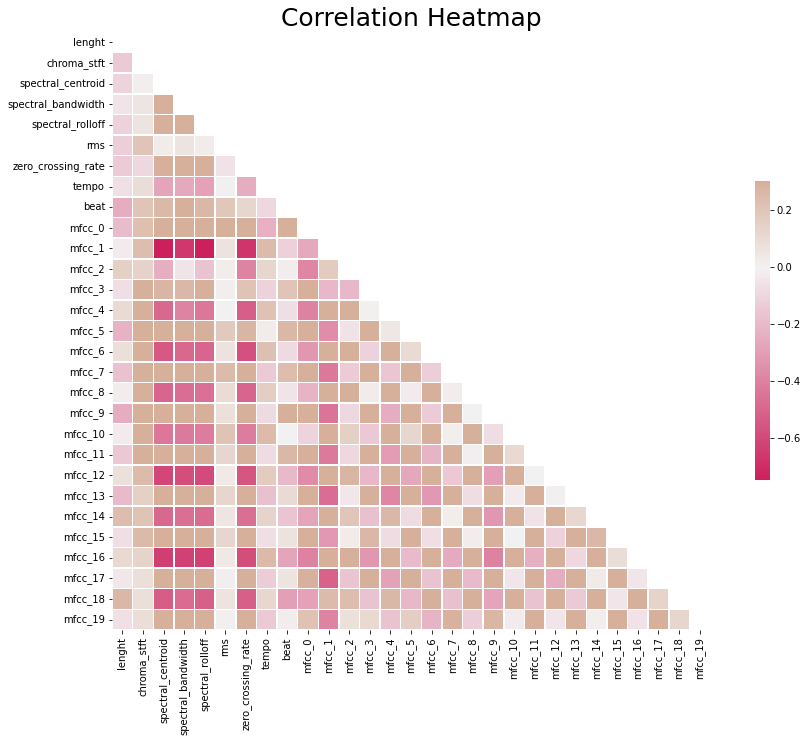

In [ ]:
import seaborn as sns

# Computing the Correlation Matrix
spike_cols = [col for col in tdf.columns]
corr = tdf[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);
plt.savefig("Corr Heatmap.jpg")

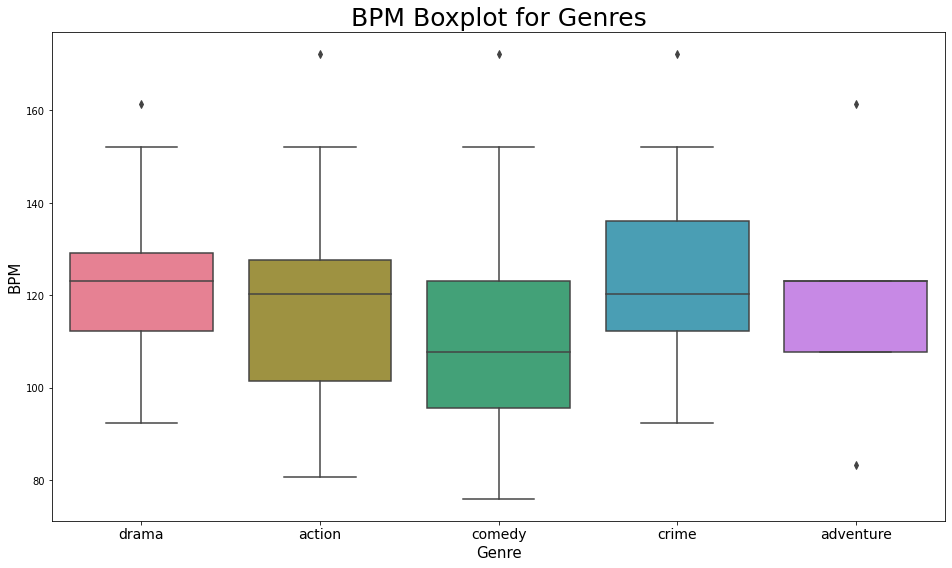

In [ ]:
x = tdf[["genre", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "genre", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

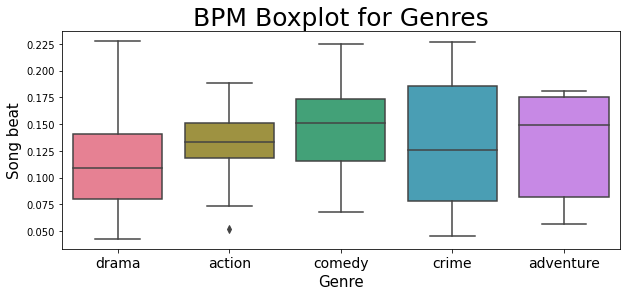

In [ ]:
x = tdf[["genre", "beat"]]

f, ax = plt.subplots(figsize=(10, 4));
sns.boxplot(x = "genre", y = "beat", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("Song beat", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

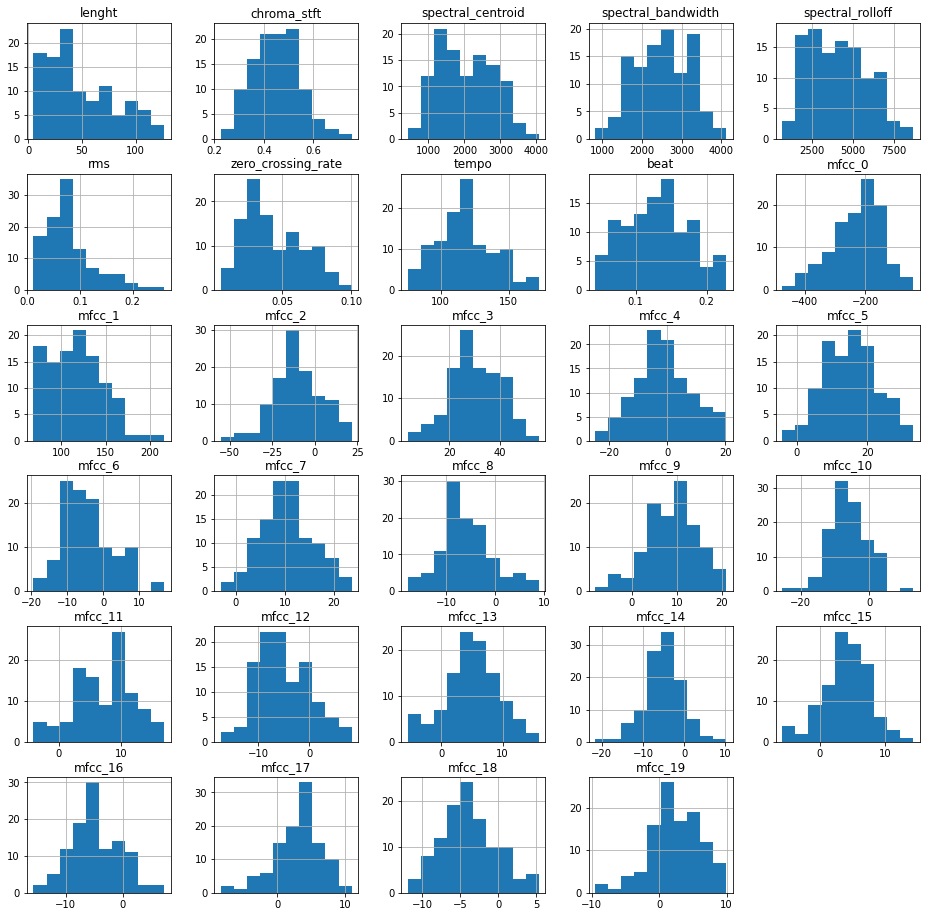

In [ ]:
#histogram of lenght
tdf.hist(figsize=(16,16))
plt.show()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f57a688fee0>,
      dtype=object)

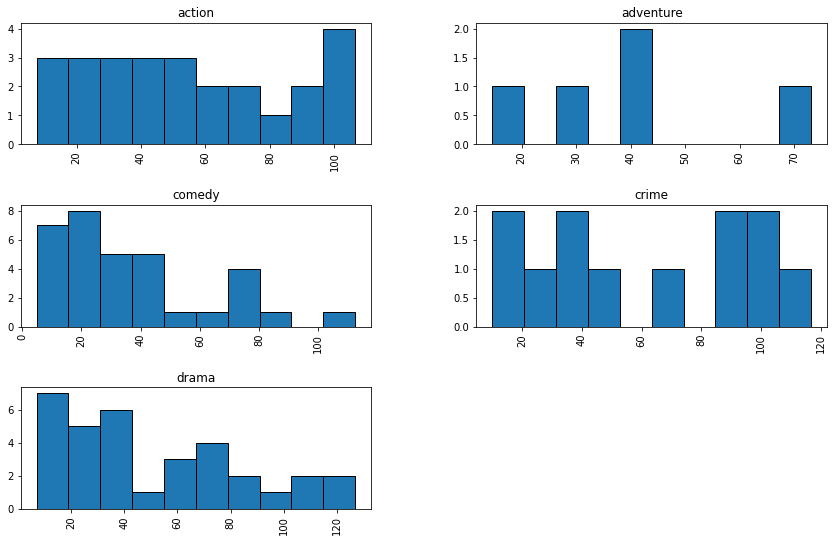

In [ ]:
tdf['lenght'].hist(by=tdf['genre'], edgecolor='black',figsize=(14,9))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f57a72a73a0>,
      dtype=object)

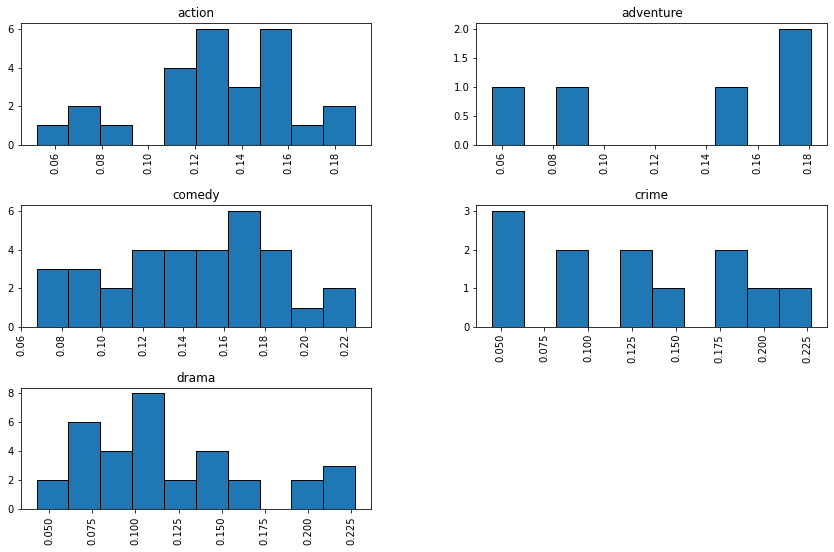

In [ ]:
tdf['beat'].hist(by=tdf['genre'], edgecolor='black',figsize=(14,9))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f57ba04bf70>,
      dtype=object)

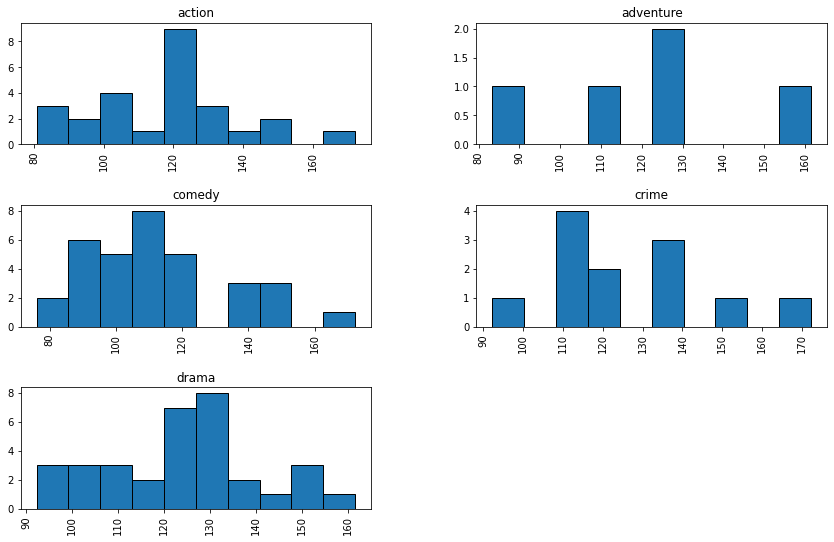

In [ ]:
tdf['tempo'].hist(by=tdf['genre'], edgecolor='black',figsize=(14,9))

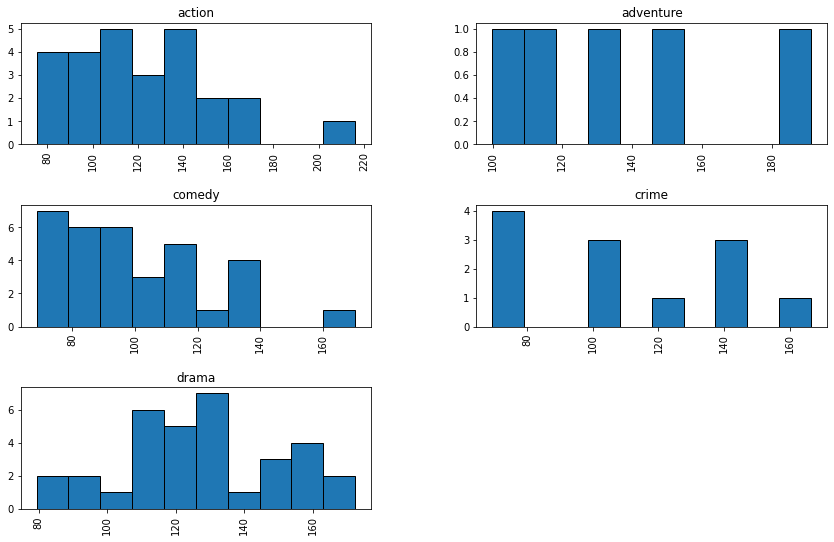

In [ ]:
tdf['mfcc_1'].hist(by=tdf['genre'], edgecolor='black',figsize=(14,9))
plt.ylabel('Frequency')
plt.xlabel('mfcc_1')
plt.show()

<function matplotlib.pyplot.show(*args, **kw)>

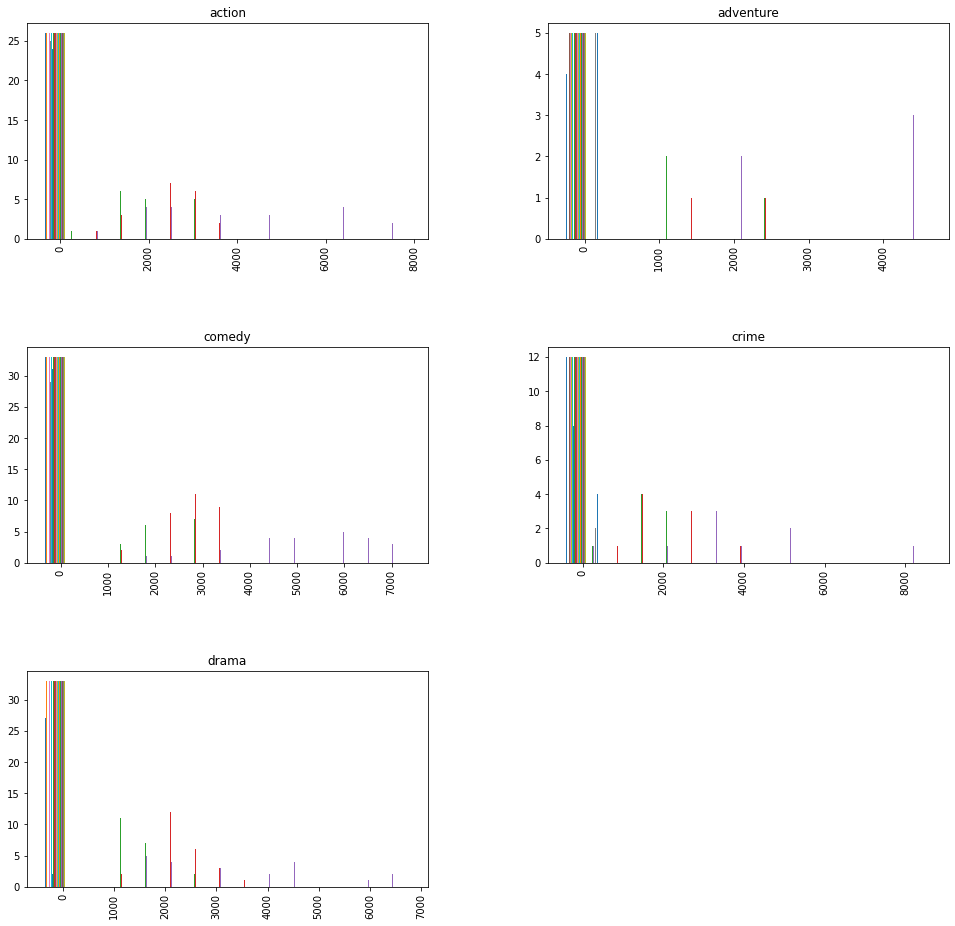

In [ ]:
tdf.hist(by='genre', figsize=[16,16], bins=15)
plt.legend()
plt.show

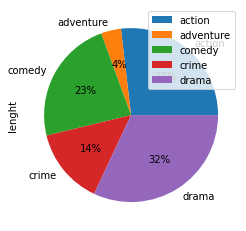

In [ ]:
# plotpie chart from genre
tdf.groupby(['genre']).sum().plot(kind='pie', y='lenght', autopct='%1.0f%%')

In [ ]:
tdf.genre.value_counts()

drama        33
comedy       33
action       26
crime        12
adventure     5
Name: genre, dtype: int64

#comedy

In [ ]:
comedydf = tdf.loc[tdf['genre'] == 'comedy']
comedydf.head(5)

,Song,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,genre
8,The_office,32.484717,0.450766,1945.106194,2653.572714,4176.795179,0.140485,0.040356,86.132812,0.135731,...,15.808560,-7.280263,9.752365,-2.430113,6.537404,-7.229854,2.148524,-4.115086,3.875500,comedy
9,Modern_family,11.795737,0.527310,2727.841445,3267.378968,5887.139623,0.092351,0.059539,117.453835,0.178476,...,10.573756,-6.749739,7.028558,-5.371390,3.444868,-7.579263,4.092646,-5.814100,0.499851,comedy
10,New_girl,15.603810,0.349092,2367.545030,2808.337845,4820.059429,0.062779,0.053671,89.102909,0.171429,...,-0.064811,-17.381239,-0.872707,-13.074641,4.404549,-8.985286,2.395751,-6.406756,4.096655,comedy
11,Two_half_man,22.639456,0.393884,1966.038238,2786.486036,4119.331558,0.066707,0.036138,112.347147,0.173450,...,4.430207,-10.333097,7.327871,-5.639443,3.940741,-4.682485,3.126870,-4.530944,2.734410,comedy
12,HIMYM,12.585215,0.510575,2061.717603,3112.636157,4449.116998,0.067964,0.032376,135.999178,0.175938,...,8.373632,-9.044813,8.228540,-5.718500,6.803611,-9.632604,1.853589,-7.274385,-2.179670,comedy


In [ ]:
comedydf.describe()

,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat,mfcc_0,...,mfcc_10,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19
count,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,...,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,37.015586,0.426085,2450.981571,2818.666178,5068.360783,0.081458,0.055409,111.901644,0.144031,-195.657855,...,-7.664618,8.413767,-8.156188,6.400211,-6.907433,4.953366,-7.111859,3.568393,-5.860884,2.475230
std,26.448566,0.083278,688.668201,586.220929,1504.588881,0.041409,0.021476,21.891284,0.039740,70.953668,...,4.142154,4.835920,3.903378,4.229125,3.492706,2.797116,3.287927,2.973331,2.347970,4.747619
min,4.806531,0.226142,860.677976,1264.152400,1683.948864,0.022942,0.013020,75.999540,0.067526,-384.330000,...,-16.703293,-4.007324,-17.381239,-5.002467,-15.576170,-1.170857,-14.139338,-2.624132,-10.258407,-9.483158
25%,17.356917,0.376387,1966.038238,2614.618115,4176.795179,0.051973,0.036435,95.703125,0.115587,-236.729840,...,-10.087197,4.875536,-10.044771,3.742963,-8.322147,3.444868,-8.985286,1.853589,-7.421085,0.499851
50%,31.091519,0.423752,2618.521522,2897.205519,5319.051213,0.069287,0.058810,107.666016,0.151005,-178.755750,...,-8.364420,10.274911,-9.146550,6.940613,-6.975612,5.389693,-7.579263,3.126870,-5.814100,2.899233
75%,47.531247,0.473345,2785.554692,3267.378968,6000.055586,0.106799,0.077115,123.046875,0.173450,-145.843730,...,-5.540738,11.392349,-5.413407,9.401437,-4.287717,6.644372,-5.655483,5.210881,-4.308442,5.066413
max,112.454240,0.627679,3531.523055,3572.579325,7429.347018,0.172475,0.088911,172.265625,0.224766,-80.518060,...,2.117776,15.808560,1.001181,14.804843,-0.075839,10.651428,1.821688,8.847626,-1.001755,9.922342


In [ ]:
comedydf.max()

Song                       iCarly
lenght                  112.45424
chroma_stft              0.627679
spectral_centroid     3531.523055
spectral_bandwidth    3572.579325
spectral_rolloff      7429.347018
rms                      0.172475
zero_crossing_rate       0.088911
tempo                  172.265625
beat                     0.224766
mfcc_0                  -80.51806
mfcc_1                  170.22134
mfcc_2                  16.627794
mfcc_3                  55.680668
mfcc_4                  19.237606
mfcc_5                  33.013756
mfcc_6                   7.928957
mfcc_7                  22.823828
mfcc_8                   0.329091
mfcc_9                  20.912193
mfcc_10                  2.117776
mfcc_11                  15.80856
mfcc_12                  1.001181
mfcc_13                 14.804843
mfcc_14                 -0.075839
mfcc_15                 10.651428
mfcc_16                  1.821688
mfcc_17                  8.847626
mfcc_18                 -1.001755
mfcc_19       

In [ ]:
comedydf.min()

Song                  2_Broke_Girls
lenght                     4.806531
chroma_stft                0.226142
spectral_centroid        860.677976
spectral_bandwidth        1264.1524
spectral_rolloff        1683.948864
rms                        0.022942
zero_crossing_rate          0.01302
tempo                      75.99954
beat                       0.067526
mfcc_0                      -384.33
mfcc_1                    68.720215
mfcc_2                   -55.284363
mfcc_3                    14.564161
mfcc_4                   -24.765903
mfcc_5                    -0.587973
mfcc_6                   -19.364258
mfcc_7                     3.204903
mfcc_8                    -17.76467
mfcc_9                    -1.039262
mfcc_10                  -16.703293
mfcc_11                   -4.007324
mfcc_12                  -17.381239
mfcc_13                   -5.002467
mfcc_14                   -15.57617
mfcc_15                   -1.170857
mfcc_16                  -14.139338
mfcc_17                   -2

In [ ]:
comedydf.mean()

<ipython-input-118-0bd02b7a8e00>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  37.015586
chroma_stft              0.426085
spectral_centroid     2450.981571
spectral_bandwidth    2818.666178
spectral_rolloff      5068.360783
rms                      0.081458
zero_crossing_rate       0.055409
tempo                  111.901644
beat                     0.144031
mfcc_0                -195.657855
mfcc_1                  99.912766
mfcc_2                 -14.787450
mfcc_3                  32.211162
mfcc_4                  -5.915429
mfcc_5                  16.263286
mfcc_6                  -7.258058
mfcc_7                  11.560762
mfcc_8                  -8.347879
mfcc_9                  10.931380
mfcc_10                 -7.664618
mfcc_11                  8.413767
mfcc_12                 -8.156188
mfcc_13                  6.400211
mfcc_14                 -6.907433
mfcc_15                  4.953366
mfcc_16                 -7.111859
mfcc_17                  3.568393
mfcc_18                 -5.860884
mfcc_19                  2.475230
dtype: float64

In [ ]:
comedydf.median()

<ipython-input-119-6d9937b38d28>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  31.091519
chroma_stft              0.423752
spectral_centroid     2618.521522
spectral_bandwidth    2897.205519
spectral_rolloff      5319.051213
rms                      0.069287
zero_crossing_rate       0.058810
tempo                  107.666016
beat                     0.151005
mfcc_0                -178.755750
mfcc_1                  93.943570
mfcc_2                 -13.937410
mfcc_3                  28.270893
mfcc_4                  -6.318389
mfcc_5                  15.821782
mfcc_6                  -8.613079
mfcc_7                  10.857926
mfcc_8                  -8.561971
mfcc_9                  10.871323
mfcc_10                 -8.364420
mfcc_11                 10.274911
mfcc_12                 -9.146550
mfcc_13                  6.940613
mfcc_14                 -6.975612
mfcc_15                  5.389693
mfcc_16                 -7.579263
mfcc_17                  3.126870
mfcc_18                 -5.814100
mfcc_19                  2.899233
dtype: float64

#action

In [ ]:
actiondf = tdf.loc[tdf['genre'] == 'action']

In [ ]:
actiondf.max()

Song                  Wheel_of_Time
lenght                   106.440292
chroma_stft                0.754121
spectral_centroid        3304.13121
spectral_bandwidth      3960.639321
spectral_rolloff        7948.002844
rms                        0.259807
zero_crossing_rate         0.081751
tempo                    172.265625
beat                        0.18866
mfcc_0                   -41.149147
mfcc_1                    216.15997
mfcc_2                    13.846865
mfcc_3                    42.105648
mfcc_4                    20.224152
mfcc_5                    30.658495
mfcc_6                    15.259133
mfcc_7                     23.59721
mfcc_8                     7.744443
mfcc_9                    19.135298
mfcc_10                    4.319921
mfcc_11                    16.83015
mfcc_12                    8.224956
mfcc_13                   15.905671
mfcc_14                    5.933674
mfcc_15                   14.380599
mfcc_16                    4.824505
mfcc_17                    1

In [ ]:
actiondf.min()

Song                  Casa_de_Papel
lenght                     7.592925
chroma_stft                0.314721
spectral_centroid        459.819044
spectral_bandwidth       814.150946
spectral_rolloff         889.567852
rms                        0.018148
zero_crossing_rate         0.009174
tempo                     80.749512
beat                       0.052025
mfcc_0                     -394.036
mfcc_1                     75.17654
mfcc_2                   -31.458086
mfcc_3                     8.421849
mfcc_4                   -15.230291
mfcc_5                     3.218535
mfcc_6                   -17.498941
mfcc_7                     -3.07349
mfcc_8                   -13.952875
mfcc_9                    -0.042348
mfcc_10                  -25.316021
mfcc_11                    -1.19409
mfcc_12                   -11.93685
mfcc_13                   -4.575845
mfcc_14                  -21.621532
mfcc_15                   -3.531938
mfcc_16                  -15.618864
mfcc_17                   -7

In [ ]:
actiondf.mean()

<ipython-input-123-4903e334bf63>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  54.406144
chroma_stft              0.492671
spectral_centroid     1991.529457
spectral_bandwidth    2553.376784
spectral_rolloff      4133.210352
rms                      0.079130
zero_crossing_rate       0.041705
tempo                  117.506751
beat                     0.129930
mfcc_0                -227.347017
mfcc_1                 121.816454
mfcc_2                  -8.532873
mfcc_3                  30.379592
mfcc_4                   2.059720
mfcc_5                  17.132148
mfcc_6                  -2.683726
mfcc_7                  11.706188
mfcc_8                  -4.485106
mfcc_9                  10.710539
mfcc_10                 -5.775816
mfcc_11                  8.370294
mfcc_12                 -4.158097
mfcc_13                  4.977248
mfcc_14                 -4.868767
mfcc_15                  4.601348
mfcc_16                 -4.097505
mfcc_17                  3.950485
mfcc_18                 -3.747439
mfcc_19                  2.127900
dtype: float64

In [ ]:
actiondf.median()

<ipython-input-124-f8a2177e711e>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  51.484448
chroma_stft              0.480915
spectral_centroid     1969.419627
spectral_bandwidth    2487.457784
spectral_rolloff      3920.910414
rms                      0.066162
zero_crossing_rate       0.034809
tempo                  120.250355
beat                     0.133464
mfcc_0                -212.304275
mfcc_1                 117.682160
mfcc_2                 -10.171596
mfcc_3                  31.181110
mfcc_4                   2.095758
mfcc_5                  18.210178
mfcc_6                  -3.753677
mfcc_7                  11.850293
mfcc_8                  -5.419342
mfcc_9                  11.801350
mfcc_10                 -5.684870
mfcc_11                  9.264157
mfcc_12                 -6.061317
mfcc_13                  5.720786
mfcc_14                 -4.629839
mfcc_15                  4.298719
mfcc_16                 -2.849418
mfcc_17                  4.251057
mfcc_18                 -3.848236
mfcc_19                  1.771847
dtype: float64

#advebture

In [ ]:
addf = tdf.loc[tdf['genre'] == 'adventure']

In [ ]:
addf.max()

Song                  Rick_and_Morty
lenght                     73.073208
chroma_stft                 0.549245
spectral_centroid        2504.905764
spectral_bandwidth       2800.592343
spectral_rolloff         4662.416983
rms                         0.194941
zero_crossing_rate          0.048357
tempo                     161.499023
beat                        0.180859
mfcc_0                    -132.50293
mfcc_1                     191.22725
mfcc_2                     15.337076
mfcc_3                      33.14364
mfcc_4                     17.059683
mfcc_5                      18.75715
mfcc_6                     -0.079528
mfcc_7                     14.035974
mfcc_8                      4.137229
mfcc_9                     10.032846
mfcc_10                     0.339084
mfcc_11                    12.154046
mfcc_12                     4.077455
mfcc_13                     7.959455
mfcc_14                    10.153129
mfcc_15                    11.659266
mfcc_16                      4.90365
m

In [ ]:
addf.min()

Song                  A_Series_Unfortunate_Events
lenght                                  14.628571
chroma_stft                              0.321542
spectral_centroid                     1237.762356
spectral_bandwidth                    1479.241562
spectral_rolloff                      2239.434649
rms                                      0.073141
zero_crossing_rate                       0.030263
tempo                                   83.354335
beat                                     0.056285
mfcc_0                                 -280.35638
mfcc_1                                   99.94065
mfcc_2                                 -13.464622
mfcc_3                                  12.854408
mfcc_4                                 -16.528282
mfcc_5                                   1.355732
mfcc_6                                 -10.866206
mfcc_7                                   7.566399
mfcc_8                                 -11.459297
mfcc_9                                  -4.163979


In [ ]:
addf.mean()

<ipython-input-128-0600f0ca5ff2>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  39.088474
chroma_stft              0.413390
spectral_centroid     1894.835677
spectral_bandwidth    2281.769903
spectral_rolloff      3643.793652
rms                      0.121010
zero_crossing_rate       0.040282
tempo                  119.722625
beat                     0.128570
mfcc_0                -201.670172
mfcc_1                 138.459600
mfcc_2                  -4.263929
mfcc_3                  23.794940
mfcc_4                  -1.160960
mfcc_5                  12.374771
mfcc_6                  -6.810158
mfcc_7                   9.223716
mfcc_8                  -5.471324
mfcc_9                   4.669778
mfcc_10                 -6.602034
mfcc_11                  5.620287
mfcc_12                 -1.822924
mfcc_13                  6.573912
mfcc_14                 -2.537478
mfcc_15                  3.811241
mfcc_16                 -3.819675
mfcc_17                 -1.112369
mfcc_18                 -6.109327
mfcc_19                  3.043520
dtype: float64

In [ ]:
addf.median()

<ipython-input-129-f469549591e8>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  38.777324
chroma_stft              0.352037
spectral_centroid     2125.638453
spectral_bandwidth    2619.121923
spectral_rolloff      4466.621819
rms                      0.099685
zero_crossing_rate       0.045113
tempo                  123.046875
beat                     0.148759
mfcc_0                -186.441790
mfcc_1                 130.949810
mfcc_2                 -10.422877
mfcc_3                  27.357393
mfcc_4                  -1.960218
mfcc_5                  15.345098
mfcc_6                  -7.988021
mfcc_7                   8.300508
mfcc_8                  -5.868796
mfcc_9                   9.141287
mfcc_10                 -6.701771
mfcc_11                  5.313010
mfcc_12                 -4.057362
mfcc_13                  6.436358
mfcc_14                 -4.100180
mfcc_15                  3.002360
mfcc_16                 -5.992104
mfcc_17                  1.187189
mfcc_18                 -4.800310
mfcc_19                  4.214842
dtype: float64

#crime

In [ ]:
crimedf = tdf.loc[tdf['genre'] == 'crime']

In [ ]:
crimedf.max()

Song                  True_Detective
lenght                    116.749938
chroma_stft                 0.572874
spectral_centroid        4064.267627
spectral_bandwidth       4114.365423
spectral_rolloff          8684.56578
rms                         0.118904
zero_crossing_rate          0.100136
tempo                     172.265625
beat                        0.227076
mfcc_0                   -117.067474
mfcc_1                     166.50412
mfcc_2                     21.718647
mfcc_3                      45.16106
mfcc_4                     17.792927
mfcc_5                     32.879925
mfcc_6                      6.316731
mfcc_7                     18.867533
mfcc_8                     -3.981655
mfcc_9                     18.188196
mfcc_10                     3.820532
mfcc_11                    16.616184
mfcc_12                     5.082965
mfcc_13                    12.718402
mfcc_14                     6.008452
mfcc_15                    10.164768
mfcc_16                     7.342996
m

In [ ]:
crimedf.min()

Song                  Big_Little_Lies
lenght                       10.03102
chroma_stft                   0.27865
spectral_centroid          431.622332
spectral_bandwidth         873.923688
spectral_rolloff           712.886011
rms                          0.012481
zero_crossing_rate           0.005222
tempo                       92.285156
beat                         0.045263
mfcc_0                     -473.95255
mfcc_1                         69.399
mfcc_2                     -18.422066
mfcc_3                       8.667027
mfcc_4                     -11.984344
mfcc_5                      -4.052097
mfcc_6                     -12.808664
mfcc_7                      -2.930626
mfcc_8                     -12.292056
mfcc_9                      -8.197288
mfcc_10                    -11.228621
mfcc_11                     -3.329328
mfcc_12                     -9.157394
mfcc_13                     -3.692415
mfcc_14                    -12.964117
mfcc_15                      1.946228
mfcc_16     

In [ ]:
crimedf.mean()

<ipython-input-168-a2f32950ee82>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  62.429152
chroma_stft              0.416250
spectral_centroid     1842.101786
spectral_bandwidth    2446.004669
spectral_rolloff      3744.337265
rms                      0.064702
zero_crossing_rate       0.036057
tempo                  126.203058
beat                     0.127853
mfcc_0                -273.237835
mfcc_1                 109.987869
mfcc_2                  -3.591246
mfcc_3                  28.941881
mfcc_4                   1.824138
mfcc_5                  15.955623
mfcc_6                  -4.055235
mfcc_7                   9.138995
mfcc_8                  -6.418650
mfcc_9                   6.952534
mfcc_10                 -5.932127
mfcc_11                  6.609598
mfcc_12                 -3.515524
mfcc_13                  6.031690
mfcc_14                 -3.550914
mfcc_15                  5.289189
mfcc_16                 -2.109299
mfcc_17                  3.264493
mfcc_18                 -3.146334
mfcc_19                  2.737498
dtype: float64

In [ ]:
crimedf.median()

<ipython-input-134-efaf783ee234>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  51.484448
chroma_stft              0.480915
spectral_centroid     1969.419627
spectral_bandwidth    2487.457784
spectral_rolloff      3920.910414
rms                      0.066162
zero_crossing_rate       0.034809
tempo                  120.250355
beat                     0.133464
mfcc_0                -212.304275
mfcc_1                 117.682160
mfcc_2                 -10.171596
mfcc_3                  31.181110
mfcc_4                   2.095758
mfcc_5                  18.210178
mfcc_6                  -3.753677
mfcc_7                  11.850293
mfcc_8                  -5.419342
mfcc_9                  11.801350
mfcc_10                 -5.684870
mfcc_11                  9.264157
mfcc_12                 -6.061317
mfcc_13                  5.720786
mfcc_14                 -4.629839
mfcc_15                  4.298719
mfcc_16                 -2.849418
mfcc_17                  4.251057
mfcc_18                 -3.848236
mfcc_19                  1.771847
dtype: float64

#drama

In [ ]:
draam = tdf.loc[tdf['genre'] == 'drama']

In [ ]:
draam.min()

Song                  13_Reasons_Why
lenght                      7.024042
chroma_stft                 0.324058
spectral_centroid         820.841681
spectral_bandwidth       1298.298616
spectral_rolloff         1551.892778
rms                         0.012081
zero_crossing_rate          0.015143
tempo                      92.285156
beat                        0.042604
mfcc_0                    -397.63812
mfcc_1                      79.39869
mfcc_2                    -43.952003
mfcc_3                      3.404231
mfcc_4                    -12.143085
mfcc_5                      2.599688
mfcc_6                    -11.679541
mfcc_7                      0.570334
mfcc_8                    -15.911804
mfcc_9                     -5.141156
mfcc_10                   -15.144395
mfcc_11                    -3.505285
mfcc_12                   -13.280075
mfcc_13                    -5.430863
mfcc_14                   -14.191781
mfcc_15                    -5.788379
mfcc_16                   -11.786725
m

In [ ]:
draam.max()

Song                          You
lenght                 126.804187
chroma_stft              0.658026
spectral_centroid     3314.477846
spectral_bandwidth    3640.374162
spectral_rolloff       6823.04107
rms                      0.214602
zero_crossing_rate       0.073495
tempo                  161.499023
beat                     0.227466
mfcc_0                -116.495804
mfcc_1                  172.45523
mfcc_2                  17.849205
mfcc_3                  47.086014
mfcc_4                  16.580019
mfcc_5                  26.097544
mfcc_6                  16.942322
mfcc_7                  17.595718
mfcc_8                   8.864103
mfcc_9                  15.781289
mfcc_10                 12.801037
mfcc_11                 15.424092
mfcc_12                  8.244325
mfcc_13                  11.63336
mfcc_14                  2.524196
mfcc_15                  8.879952
mfcc_16                  2.426643
mfcc_17                  7.826376
mfcc_18                  3.848464
mfcc_19       

In [ ]:
draam.mean()

<ipython-input-172-97247771561c>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  51.021654
chroma_stft              0.462428
spectral_centroid     1703.423916
spectral_bandwidth    2260.144258
spectral_rolloff      3436.443272
rms                      0.076241
zero_crossing_rate       0.035840
tempo                  123.805780
beat                     0.120124
mfcc_0                -245.898075
mfcc_1                 127.435435
mfcc_2                  -9.659710
mfcc_3                  28.972939
mfcc_4                  -0.326552
mfcc_5                  12.799888
mfcc_6                  -2.764079
mfcc_7                   9.006708
mfcc_8                  -4.199891
mfcc_9                   6.232099
mfcc_10                 -4.886480
mfcc_11                  5.297032
mfcc_12                 -3.911745
mfcc_13                  3.226200
mfcc_14                 -4.657544
mfcc_15                  2.559247
mfcc_16                 -4.011887
mfcc_17                  2.538838
mfcc_18                 -1.835314
mfcc_19                  2.016758
dtype: float64

In [ ]:
draam.median()

<ipython-input-139-fdeccbd0c396>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.


lenght                  51.484448
chroma_stft              0.480915
spectral_centroid     1969.419627
spectral_bandwidth    2487.457784
spectral_rolloff      3920.910414
rms                      0.066162
zero_crossing_rate       0.034809
tempo                  120.250355
beat                     0.133464
mfcc_0                -212.304275
mfcc_1                 117.682160
mfcc_2                 -10.171596
mfcc_3                  31.181110
mfcc_4                   2.095758
mfcc_5                  18.210178
mfcc_6                  -3.753677
mfcc_7                  11.850293
mfcc_8                  -5.419342
mfcc_9                  11.801350
mfcc_10                 -5.684870
mfcc_11                  9.264157
mfcc_12                 -6.061317
mfcc_13                  5.720786
mfcc_14                 -4.629839
mfcc_15                  4.298719
mfcc_16                 -2.849418
mfcc_17                  4.251057
mfcc_18                 -3.848236
mfcc_19                  1.771847
dtype: float64

#Build Model - Single Labeled KNN



*   Only single labeled songs
* Only have 5 categories

Bad classification: accuracy of 50%




In [ ]:
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE

In [ ]:
data = df.iloc[0:, 1:]
data.head()
#df without the files names

,lenght,chroma_stft,spectral_centroid,spectral_bandwidth,spectral_rolloff,rms,zero_crossing_rate,tempo,beat,mfcc_0,...,mfcc_11,mfcc_12,mfcc_13,mfcc_14,mfcc_15,mfcc_16,mfcc_17,mfcc_18,mfcc_19,genre
0,18.041905,0.606678,1724.248283,2457.971205,3805.270109,0.080965,0.026026,123.046875,0.070617,-274.637329,...,13.064988,0.444842,7.141653,-1.856654,7.911494,-2.303205,2.347878,-0.134462,0.056747,drama
1,70.797642,0.324058,1509.057054,2255.377053,2635.365373,0.214602,0.029557,129.199219,0.093169,-161.339615,...,2.322693,-10.201549,-3.315402,-6.908276,4.171134,-4.884076,-0.354753,0.196119,-4.870142,drama
2,12.469116,0.500071,2615.713634,2954.695694,5330.359148,0.104709,0.064162,103.359375,0.139088,-137.910461,...,7.619081,-5.054358,8.874400,-3.639888,7.989773,-0.738747,5.845138,-2.164878,4.730607,drama
3,72.701678,0.398203,2262.388168,2820.101929,4598.035095,0.086368,0.050233,117.453835,0.140456,-217.101746,...,3.898463,-9.944083,1.435769,-7.186730,2.501754,-2.499355,2.333581,-4.027172,5.271726,drama
4,27.933605,0.343727,2089.265684,2701.204982,4465.048779,0.017725,0.050944,123.046875,0.138128,-351.466003,...,5.497686,-7.935298,7.435072,-6.467572,5.019539,-4.574422,5.415137,-2.643821,3.809658,drama


In [ ]:
y = data['genre'] # genre variable.
X = data.loc[:, data.columns != 'genre'] #select all columns but not the labels

#### NORMALIZE X ####

# Normalize so everything is on the same scale.

cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)

# new data frame with the new scaled data.
X = pd.DataFrame(np_scaled, columns = cols)

In [ ]:
# dividing into training and test Data
X_train,x_test, Y_train, y_test = train_test_split(X,y,test_size=0.2)

In [ ]:
#Build Model
# KNN classifier Train
classifier = sklearn.neighbors.KNeighborsClassifier(n_neighbors = 16) #define classifier
classifier.fit(X_train, Y_train) #train

KNeighborsClassifier(n_neighbors=16)

In [ ]:
preds = classifier.predict(x_test)
print('Accuracy of KNN:', round(accuracy_score(y_test, preds), 5), '\n')

Accuracy of KNN: 0.36364 



In [ ]:
from sklearn.ensemble import RandomForestClassifier

rforest = RandomForestClassifier(n_estimators=200, max_depth=5, random_state=0)
rforest.fit(X_train, Y_train) #train

RandomForestClassifier(max_depth=5, n_estimators=200, random_state=0)

In [ ]:
fore = rforest.predict(x_test)
print('Accuracy of random forest:', round(accuracy_score(y_test, fore), 5), '\n')

Accuracy of random forest: 0.5 



In [ ]:
from sklearn.svm import SVC

svm = SVC(decision_function_shape="ovo")
svm.fit(X_train, Y_train) #train

ssv = svm.predict(x_test)
print('Accuracy of svm :', round(accuracy_score(y_test, ssv), 5), '\n')

Accuracy of svm : 0.54545 





#Feature importance

In [ ]:
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 216 kB 31.5 MB/s 
     |████████████████████████████████| 133 kB 57.2 MB/s 
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107748 sha256=65e5194d8fe337fc7d27e7e4efaec618500bc8bc1d92103158e12fd82f935fa3
  Stored in directory: /root/.cache/pip/wheels/85/ac/25/ffcd87ef8f9b1eec324fdf339359be71f22612459d8c75d89c
Successfully built eli5
  Attempting uninstall: jinja2
    Found existing installation: Jinja2 2.11.3
    Uninstalling Jinja2-2.11.3:
      Successfully uninstalled Jinja2-2.11.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
notebook 5.7.16 requires jinja2<=3.0.0, but you have jinja2 3.1.2 which is incompatible.
flask 1.1.4 requires Jinja2<3.0,>=2.10.1, but you have jinja2 3.1.2 which is incomp

In [ ]:
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(estimator=classifier, random_state=1)
perm.fit(x_test, y_test)

PermutationImportance(estimator=KNeighborsClassifier(n_neighbors=16),
                      random_state=1)

In [ ]:
columns = df.drop(['genre','Song'], axis=1).columns.tolist()

In [ ]:
eli5.show_weights(estimator=perm, feature_names = columns)

Weight,Feature
0.0455 ± 0.0000,spectral_bandwidth
0.0455 ± 0.0000,mfcc_10
0.0182 ± 0.0727,mfcc_18
0.0091 ± 0.0680,mfcc_5
0.0091 ± 0.0364,mfcc_2
0.0000 ± 0.0813,spectral_rolloff
0.0000 ± 0.0575,mfcc_15
0.0000 ± 0.0575,mfcc_12
0.0000 ± 0.0575,chroma_stft
0.0000 ± 0.0813,mfcc_7


#CNN
https://www.kaggle.com/code/soumyasharma20/music-genre-classification-using-cnn#Scaling-the-features

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
from tensorflow import keras

In [ ]:
dfff = df.drop(labels="Song",axis=1)
class_list=dfff.iloc[:,-1]
converter=LabelEncoder()

In [ ]:
y=converter.fit_transform(class_list)
y

array([4, 4, 4, 4, 4, 0, 4, 4, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 4, 4,
       2, 2, 4, 3, 0, 2, 2, 1, 2, 2, 2, 0, 4, 4, 0, 0, 3, 0, 4, 2, 1, 2,
       1, 0, 4, 1, 0, 2, 3, 0, 2, 4, 3, 2, 2, 4, 0, 4, 2, 0, 0, 4, 2, 0,
       4, 4, 0, 2, 2, 0, 4, 4, 2, 3, 0, 3, 4, 4, 2, 0, 0, 2, 1, 4, 3, 3,
       0, 0, 0, 0, 4, 3, 4, 2, 4, 0, 4, 3, 0, 2, 4, 3, 4, 4, 0, 3, 0])

In [ ]:
print(dfff.iloc[:,:-1])

        lenght  chroma_stft  spectral_centroid  spectral_bandwidth  \
0    18.041905     0.606678        1724.248283         2457.971205   
1    70.797642     0.324058        1509.057054         2255.377053   
2    12.469116     0.500071        2615.713634         2954.695694   
3    72.701678     0.398203        2262.388168         2820.101929   
4    27.933605     0.343727        2089.265684         2701.204982   
..         ...          ...                ...                 ...   
104  30.139521     0.468431        3314.477846         3640.374162   
105  30.023401     0.409891        1645.299606         2103.878980   
106  58.444626     0.393957        1799.617942         2654.525358   
107  69.799184     0.572874        2495.374782         3166.929076   
108  35.456871     0.594499        3246.235552         3601.859088   

     spectral_rolloff       rms  zero_crossing_rate       tempo      beat  \
0         3805.270109  0.080965            0.026026  123.046875  0.070617   
1    

In [ ]:
from sklearn.preprocessing import StandardScaler
fit=StandardScaler()
X=fit.fit_transform(np.array(dfff.iloc[:,:-1],dtype=float))

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.33)

In [ ]:
len(y_test)

36

In [ ]:
len(y_train)

73

building the model

In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras import layers

In [ ]:
from keras.models import Sequential

In [ ]:
def trainModel(model,epochs,optimizer):
    batch_size=128
    model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics='accuracy')
    return model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=epochs,batch_size=batch_size)

In [ ]:
def plotValidate(history):
    print("Validation Accuracy",max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()

In [ ]:
model=tf.keras.models.Sequential([
    tf.keras.layers.Dense(512,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(256,activation='relu'),
    keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dropout(0.2),

    tf.keras.layers.Dense(10,activation='softmax'),
])

print(model.summary())
model_history=trainModel(model=model,epochs=600,optimizer='adam')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               15360     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                8

In [ ]:
test_loss,test_acc=model.evaluate(X_test,y_test,batch_size=128)
print("The test loss is ",test_loss)
print("The best accuracy is: ",test_acc*100)

1/1 [==============================] - 0s 24ms/step - loss: 7.4001 - accuracy: 0.3611
The test loss is  7.400129318237305
The best accuracy is:  36.11111044883728


In [ ]:
test_loss,test_acc=model.evaluate(X_test,y_test,batch_size=128)
print("The test loss is ",test_loss)
print("The best accuracy is: ",test_acc*100)

1/1 [==============================] - 0s 25ms/step - loss: 5.9426 - accuracy: 0.4167
The test loss is  5.942616939544678
The best accuracy is:  41.66666567325592


There is a very low accuracy, which can help us create a better classification system for tv shows, as there are multiple shows classified as the same genre, but they show different characteristics that lead them to be another genre instead.